# Init

In [ ]:
!nvidia-smi # to see what GPU you have
!pip install wandb --quiet

Wed Mar 15 15:23:10 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   67C    P0    33W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import numpy as np
import torch
from torchsummary import summary
import torchvision #This library is used for image-based operations (Augmentations)
import os
import gc
from tqdm import tqdm
from PIL import Image
import pandas as pd
from sklearn.metrics import accuracy_score
import glob
import wandb
import matplotlib.pyplot as plt
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device: ", device)

Device:  cuda


# Config

In [ ]:
config = {
    'name': 'UNeXt_2',
    'architecture': 'UNeXt',
    'batch_size': 3,
    'lr': 1e-3,
    'epochs': 0,
    'channels': 64,
    'weight_decay': 1e-4,
    'eta_min': 1e-8,
    'mixed_precision': True,
    'scheduler': 'ReduceLROnPlateau',
    'factor': 0.2, 
    # 'restart_period': 20,
    'patience': 7,
    'augment': 'Custom',
    'label_smoothing': 0.2,
    'valid_divider' : 10,
    'positive_label_weight': 30
    # 'start_factor': 0.000001,
    # 'warm_up': 20
}

SAVE_MODEL = True
LOAD_MODEL = True

# Import Dataset

In [ ]:
drive_root = '/content/drive'
from google.colab import drive # Link your drive if you are a colab user
drive.mount(drive_root)

Mounted at /content/drive


In [ ]:
# Load dataset
DATA_DIR = '/content/data/dataset'
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
VAL_DIR = os.path.join(DATA_DIR, 'valid')
TEST_DIR = os.path.join(DATA_DIR, 'test')

In [ ]:
!unzip -qo '/content/drive/MyDrive/dataset.zip' -d '/content/data'

# Define and Init Dataloader

In [ ]:
class SegmentationDataset(torch.utils.data.Dataset):
    def __init__(self, data_dir, transforms = []):
        self.data_dir = data_dir
        self.transforms = transforms
        self.pil_to_tensor = torchvision.transforms.ToTensor()

        # Get all filenames
        files = os.listdir(self.data_dir)
        filenames = []
        pics = []
        labels = []
        for file in files:
            if file.endswith('.jpg'):
                pic_path = os.path.join(self.data_dir, file)
                pics.append(self.pil_to_tensor(Image.open(pic_path)))

                pic_root = pic_path[:-4]
                label_path = pic_root + "_label.npy"
                label_val = torch.from_numpy(np.load(label_path))
                label = torch.round(label_val).long()
                labels.append(label)

                filenames.append((pic_path, label_path))
        self.filenames = filenames
        self.pics = torch.stack(pics, dim = 0)
        self.labels = torch.stack(labels, dim = 0)

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        # pair = self.filenames[idx]
        # image = self.pil_to_tensor(Image.open(pair[0]))
        # label = torch.from_numpy(np.load(pair[1])).long()
        image = self.pics[idx]
        label = self.labels[idx]

        if len(self.transforms) > 0:
            image = self.transforms[0](image)
            
            # Transforms that alter the position and not just illuminance must be applied to mask as well
            label = torch.unsqueeze(label, dim = 0)
            label = label.repeat(3, 1, 1)
            all = torch.stack([image, label], dim = 0)
            all = self.transforms[1](all)
            image = all[0]
            label = all[1, 0]
        label[label > 0] = 1
        label = label.long()
        return image, label

    # def collate_fn(self, batch):
    #     batch_input = torch.stack([pair[0] for pair in batch])
    #     batch_label = torch.stack([pair[1] for pair in batch])

    #     if len(self.transforms) > 0:
    #         batch_input = self.transforms[0](batch_input)
            
    #         # Transforms that alter the position and not just illuminance must be applied to mask as well
    #         batch_label = torch.unsqueeze(batch_label, dim = 1)
    #         batch_label = batch_label.repeat(1, 3, 1, 1)
    #         batch_size = batch_label.shape[0]
    #         all = torch.cat([batch_input, batch_label], dim = 0)
    #         all = self.transforms[1](all)
    #         batch_input = all[:batch_size]
    #         batch_label = all[batch_size:, 0]

    #     return batch_input, batch_label


In [ ]:
train_transforms = torchvision.transforms.Compose([ 
    # torchvision.transforms.ToTensor(), 
    torchvision.transforms.ColorJitter(brightness = 0.4, contrast= 0.4, saturation = 0.2, hue= 0.2),
    torchvision.transforms.RandomErasing(scale=(0.02, 0.10)),
    # torchvision.transforms.ToPILImage()
])

train_spatial = torchvision.transforms.Compose([
    torchvision.transforms.RandomHorizontalFlip(p=0.5),
    torchvision.transforms.RandomRotation(20),
    torchvision.transforms.RandomResizedCrop(size = (960, 1984), scale = (0.25,1.00)),
    torchvision.transforms.RandomPerspective(distortion_scale = 0.5),
])

val_transforms = torchvision.transforms.Compose([torchvision.transforms.ToTensor()])
test_transforms = torchvision.transforms.Compose([torchvision.transforms.ToTensor()])

train_dataset = SegmentationDataset(TRAIN_DIR, [train_transforms, train_spatial])
val_dataset = SegmentationDataset(VAL_DIR)
test_dataset = SegmentationDataset(TEST_DIR)

# Create data loaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size = config['batch_size'], 
                                           shuffle = True,num_workers = 2, pin_memory = True)#, collate_fn=train_dataset.collate_fn)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size = config['batch_size'], 
                                         shuffle = False, num_workers = 2)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size = config['batch_size'], shuffle = False,
                                         num_workers = 2)

In [ ]:
# my_batch = []
# for i in range(config['batch_size']):
#     my_batch.append((torch.rand((3, 960, 1984)), torch.rand((960, 1984))))

# i, l = train_loader.collate_fn(my_batch)
# print(i.shape, l.shape)

In [ ]:
# Sanity checking
print("Number of images: ", len(train_dataset))
print("Shape of image: ", train_dataset[0][0].shape)
print("Batch size: ", config['batch_size'])
print("Train batches: ", train_loader.__len__())
print("Val batches: ", val_loader.__len__())

print("Type of label:", train_dataset[0][1].dtype)
print("Shape of label:", train_dataset[0][1].shape)
for i in range(len(train_dataset)):
    print(np.unique(train_dataset[i][1]))

Number of images:  39
Shape of image:  torch.Size([3, 960, 1984])
Batch size:  3
Train batches:  13
Val batches:  3
Type of label: torch.int64
Shape of label: torch.Size([960, 1984])
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]


# Visualize Transforms

In [ ]:
# Get images
def get_images(dataloader):
    images, labels = None, None
    for i, l in dataloader:
        if images is None:
            images = i
            labels = l
        else:
            images = torch.cat([images, i], dim = 0)
            labels = torch.cat([labels, l], dim = 0)

    for i, image in enumerate(images):
        label = labels[i]
        mask = torch.unsqueeze(label, dim = 0) == 1
        image[mask.repeat(3, 1, 1)] = 1

    return torch.unsqueeze(images, dim = 1) # get a column of images

# Plots the training, validation and augmented training images
def plot(imgs, with_orig=True, row_title=None, col_title=None, title = "", **imshow_kwargs):
    # if not isinstance(imgs[0], list):
    #     # Make a 2d grid even if there's just 1 row
    #     imgs = [imgs]
    tensor_to_pil = torchvision.transforms.ToPILImage()
    num_rows = len(imgs)
    num_cols = len(imgs[0])# + with_orig
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        #row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(tensor_to_pil(img)), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    fig.suptitle(title, fontsize = 40)
    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(20)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])
    if col_title is not None:
        for col_idx in range(num_cols):
            axs[0, col_idx].set_title(col_title[col_idx], fontsize = 40)
    

175

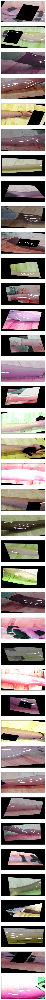

In [ ]:
plt.rcParams['figure.figsize'] = [20, 150]
images = get_images(train_loader)
plot(images, False)
gc.collect()

Define Model

In [ ]:
class ConvNextDownBlock(torch.nn.Module):
    def __init__(self, chan_ct, stride = 1):
        super().__init__()
        self.block = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels = chan_ct // stride, out_channels = chan_ct, kernel_size = 7, stride = stride, groups = chan_ct // stride, padding = 3, bias = True),
            torch.nn.BatchNorm2d(chan_ct),
            torch.nn.Conv2d(in_channels = chan_ct, out_channels = chan_ct * 4, kernel_size = 1, bias = True),
            torch.nn.GELU(),
            torch.nn.Conv2d(in_channels = chan_ct * 4, out_channels = chan_ct, kernel_size = 1, bias = True),
        )

        if stride > 1:
            self.shortcut = torch.nn.Conv2d(in_channels = chan_ct // stride, out_channels = chan_ct, kernel_size = stride, stride = stride, groups = chan_ct // stride, bias = False)
        else:
            self.shortcut = torch.nn.Identity()

    def forward(self, x):
        return self.block(x) + self.shortcut(x)

In [ ]:
class ConvNextUpBlock(torch.nn.Module):
    def __init__(self, chan_ct, stride = 1):
        super().__init__()
        self.block = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels = chan_ct * stride, out_channels = chan_ct, kernel_size = 7, stride = 1, groups = chan_ct, padding = 3, bias = True),
            torch.nn.BatchNorm2d(chan_ct),
            torch.nn.Conv2d(in_channels = chan_ct, out_channels = chan_ct * 4, kernel_size = 1, bias = True),
            torch.nn.GELU(),
            torch.nn.Conv2d(in_channels = chan_ct * 4, out_channels = chan_ct, kernel_size = 1, bias = True),
        )

        if stride > 1:
            self.shortcut = torch.nn.Conv2d(in_channels = chan_ct * stride, out_channels = chan_ct, kernel_size = 1, stride = 1, bias = False)
        else:
            self.shortcut = torch.nn.Identity()

    def forward(self, x):
        return self.block(x) + self.shortcut(x)

In [ ]:
class UNetDownBlock(torch.nn.Module):
    def __init__(self, chan_ct, first = False):
        super().__init__()
        module_list = []
        if not first:
            module_list.append(ConvNextDownBlock(chan_ct, stride = 2))
        module_list.append(ConvNextDownBlock(chan_ct))

        self.block = torch.nn.ModuleList(module_list)

    def forward(self, x):
        z = x
        for module in self.block:
            z = module(z)
        return z

In [ ]:
class UNetUpBlock(torch.nn.Module):
    def __init__(self, chan_ct):
        super().__init__()
        module_list = []
        module_list.append(torch.nn.ConvTranspose2d(in_channels = chan_ct * 2, out_channels = chan_ct, kernel_size = 2, stride = 2, bias = True))
        module_list.append(ConvNextUpBlock(chan_ct, 2))
        module_list.append(ConvNextUpBlock(chan_ct))

        self.block = torch.nn.ModuleList(module_list)

    def forward(self, x, mirror_x):
        z = self.block[0](x)
        z = self.block[1](torch.concat([mirror_x, z], dim = -3))
        z = self.block[2](z)
        return z


In [ ]:
class VeinU_Net(torch.nn.Module):
    def __init__(self, base_chan = 64, levels = 5):
        super().__init__()
        self.stem = torch.nn.Conv2d(in_channels = 3, out_channels = base_chan, kernel_size = 4, stride = 4, bias = True)
        self.levels = levels
        self.norm1 = torch.nn.BatchNorm2d(base_chan)

        blocks = []
        chan = base_chan
        blocks.append(UNetDownBlock(chan, first = True))
        # Downward blocks
        for i in range(levels - 1):
            chan *= 2
            blocks.append(UNetDownBlock(chan))

        # Upward blocks
        for i in range(levels - 1):
            chan //= 2
            blocks.append(UNetUpBlock(chan))

        self.U = torch.nn.ModuleList(blocks)
        self.expand = torch.nn.ConvTranspose2d(in_channels = chan, out_channels = chan, kernel_size = 4, stride = 4, groups = chan, bias = True)
        self.end = torch.nn.Conv2d(in_channels = chan, out_channels = 2, kernel_size = 1, bias = True)

    def forward(self, x):
        responses = []
        z = self.norm1(self.stem(x))
        for i, block in enumerate(self.U):
            if i < self.levels:
                z = block(z)
                responses.append(z)
            else:
                j = 2 * self.levels - 2 - i # on block 5, use block 3, 6 use 2, 7 use 1
                z = block(z, responses[j])
        z = self.end(self.expand(z))
        return z


In [ ]:
# Check the output
model = VeinU_Net().to(device)
summary(model, (3, 960, 1984))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 240, 496]           3,136
       BatchNorm2d-2         [-1, 64, 240, 496]             128
            Conv2d-3         [-1, 64, 240, 496]           3,200
       BatchNorm2d-4         [-1, 64, 240, 496]             128
            Conv2d-5        [-1, 256, 240, 496]          16,640
              GELU-6        [-1, 256, 240, 496]               0
            Conv2d-7         [-1, 64, 240, 496]          16,448
          Identity-8         [-1, 64, 240, 496]               0
 ConvNextDownBlock-9         [-1, 64, 240, 496]               0
    UNetDownBlock-10         [-1, 64, 240, 496]               0
           Conv2d-11        [-1, 128, 120, 248]           6,400
      BatchNorm2d-12        [-1, 128, 120, 248]             256
           Conv2d-13        [-1, 512, 120, 248]          66,048
             GELU-14        [-1, 512, 1

# Optimizer, Scheduler, Autoscaler

In [ ]:
criterion = torch.nn.CrossEntropyLoss(label_smoothing = config['label_smoothing'], reduction = 'none')
optimizer = torch.optim.AdamW(model.parameters(), lr = config['lr'], 
                              weight_decay = config['weight_decay'])
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 
                factor = config['factor'], patience = config['patience'],
                min_lr = config['eta_min'], mode = 'max')

scaler = torch.cuda.amp.GradScaler()

# Intersection Over Union

In [ ]:
def IoU_soft(output, target):
    scores = torch.nn.functional.softmax(output, dim = 1)[:, 1]
    # print(torch.max(scores), torch.min(scores), torch.var(scores, None, True))
    intersection_scores = torch.clone(scores)
    indices = target == 1
    scores[indices] = 1
    intersection_scores[torch.logical_not(indices)] = 0

    return torch.sum(intersection_scores), torch.sum(scores)

# Train

In [ ]:
def train(model, dataloader, optimizer, epoch):
    model.train()
    total_loss = 0
    union = 1e-8 # for numerical stability
    intersection = 0
    IoU = 0
    batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True, leave=False, position=0, desc='Train', ncols=5)
    positive_weight = config['positive_label_weight']

    for i, (images, labels) in enumerate(dataloader):
        optimizer.zero_grad()

        images, labels = images.to(device), labels.to(device)

        # Forward pass
        # with torch.cuda.amp.autocast():
        classification = model(images)
        mask = torch.flatten(labels, start_dim = 1)
        loss = criterion(torch.flatten(classification, start_dim = 2), mask)
        loss *= (mask * (positive_weight - 1) + 1) # over-weight the positive labels
        loss = torch.mean(loss)
        
        # Metrics
        total_loss += float(loss)

        inter, u = IoU_soft(classification, labels)
        union += u
        intersection += inter

        IoU = intersection / union

        batch_bar.set_postfix(
            intersection = "{:.04f}".format(intersection),
            union = "{:.04f}".format(union),
            iou = "{:.04f}%".format(100 * IoU),
            loss = "{:.04f}".format(total_loss / (i + 1)),
            lr = "{:.06f}".format(float(optimizer.param_groups[0]['lr']))
        )

        # Backprop
        # scaler.scale(loss).backward()
        # scaler.step(optimizer)
        # scaler.update()
        loss.backward()
        optimizer.step()

        batch_bar.update()
    
    batch_bar.close()

    return IoU, total_loss / len(dataloader)


# Validation

In [ ]:
def valid(model, dataloader, optimizer):
    model.eval()
    total_loss = 0
    union = 1e-8 # for numerical stability
    intersection = 0
    IoU = 0
    batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True, leave=False, position=0, desc='Valid', ncols=5)
    positive_weight = config['positive_label_weight']
    
    image = None

    for i, (images, labels) in enumerate(dataloader):
        optimizer.zero_grad()

        images, labels = images.to(device), labels.to(device)

        # Forward pass
        with torch.inference_mode():
            classification = model(images)
            mask = torch.flatten(labels, start_dim = 1)
            loss = criterion(torch.flatten(classification, start_dim = 2), mask)
            loss *= (mask * (positive_weight - 1) + 1) # over-weight the positive labels
            loss = torch.mean(loss)
        
        # Metrics
        total_loss += float(loss)

        inter, u = IoU_soft(classification, labels)
        union += u
        intersection += inter

        IoU = intersection / union

        batch_bar.set_postfix(
            intersection = "{:.04f}".format(intersection),
            union = "{:.04f}".format(union),
            iou = "{:.04f}%".format(100 * IoU),
            loss = "{:.04f}".format(total_loss / (i + 1))
        )

        batch_bar.update()

        # Save one image for display
        if i == 0:
            image = images[2]
            mask = torch.argmax(classification[2], dim = 0) == 1
            mask = torch.unsqueeze(mask, dim = 0).repeat(3, 1, 1)
            image[mask] = 1 

    batch_bar.close()
    scheduler.step(IoU)

    return IoU, total_loss / len(dataloader), image

# Run

In [ ]:
gc.collect()
torch.cuda.empty_cache()

wandb.login(key = '2fe54db29c2f3b04c92b08a6fa9872847ec64c80')

# Optionally load previous model state
run = None
start_epoch = 0
best_IoU = 0
if LOAD_MODEL:
    prev_state = torch.load('/content/drive/MyDrive/' + config['name'] + '.pth')
    model.load_state_dict(prev_state['model_state_dict'])
    optimizer.load_state_dict(prev_state['optimizer_state_dict'])
    scheduler.load_state_dict(prev_state['scheduler_state_dict'])
    best_IoU = prev_state['val_acc']
    start_epoch = prev_state['epoch']
    run_id = prev_state['run_id']
    
    if config['epochs'] > 0:
        run = wandb.init(
            name = config['name'],
            # reinit = True,
            id = run_id,
            resume = "must",
            project = "VeinSegmentation",
            config = config
        )

else:
    run = wandb.init(
        name = config['name'],
        reinit = True,
        # id = "",
        # resume = "must",
        project = "VeinSegmentation",
        config = config
    )
    run_id = run.id

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:

tensor_to_pil = torchvision.transforms.ToPILImage()
for epoch in range(start_epoch, config['epochs']):
    wandb_dict = {}
    curr_lr = float(optimizer.param_groups[0]['lr'])
    wandb_dict['lr'] = curr_lr
    IoU, avg_loss = train(model, train_loader, optimizer, epoch)

    print("\nEpoch:{}/{}: \nTrain IoU:{:.04f}%\t Train Loss:{:.04f}\t Learning Rate {:.06f}". format(
        epoch + 1,
        config['epochs'],
        IoU * 100,
        avg_loss,
        curr_lr
    ))

    wandb_dict['train_IoU'] = IoU
    wandb_dict['train_loss'] = avg_loss

    # Validation
    if epoch % config['valid_divider'] == 0:
        val_IoU, val_avg_loss, image = valid(model, val_loader, optimizer)
        print("Val IoU:{:04f}%\t Val Loss:{:.04f}\t". format(
            val_IoU * 100,
            val_avg_loss
        ))
        wandb_dict['valid_IoU'] = val_IoU
        wandb_dict['valid_loss'] = val_avg_loss
        wandb_dict['example'] = wandb.Image(image)

        # Save good models
        if SAVE_MODEL and val_IoU >= best_IoU:
            print("Saving model")
            torch.save({'model_state_dict':model.state_dict(),
                        'optimizer_state_dict':optimizer.state_dict(),
                        'scheduler_state_dict':scheduler.state_dict(),
                        'val_acc': val_IoU, 
                        'epoch': epoch,
                        'run_id': run_id}, '/content/drive/MyDrive/' + config['name'] + '.pth')
            best_IoU = val_IoU
            wandb.save(config['name'] + 'checkpoint.pth')


    wandb.log(wandb_dict)
if config['epochs'] > 0:
    run.finish()


In [ ]:
# print("Saving model")
# torch.save({'model_state_dict':model.state_dict(),
#             'optimizer_state_dict':optimizer.state_dict(),
#             'scheduler_state_dict':scheduler.state_dict(),
#             'val_acc': val_IoU, 
#             'epoch': epoch,
#             'run_id': run_id}, '/content/drive/MyDrive/' + config['name'] + '_latest.pth')

# run.finish()

# Test

In [ ]:
def test(model, dataloader, optimizer):
    model.eval()
    total_loss = 0
    union = 1e-8 # for numerical stability
    intersection = 0
    IoU = 0
    batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True, leave=False, position=0, desc='Valid', ncols=5)
    positive_weight = config['positive_label_weight']
    
    results = []
    inputs = []
    actuals = []
    for i, (images, labels) in enumerate(dataloader):
        optimizer.zero_grad()
        inputs.append(images)
        actuals.append(labels)
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        with torch.inference_mode():
            classification = model(images)
            mask = torch.flatten(labels, start_dim = 1)
            loss = criterion(torch.flatten(classification, start_dim = 2), mask)
            loss *= (mask * (positive_weight - 1) + 1) # over-weight the positive labels
            loss = torch.mean(loss)
        
        # Metrics
        total_loss += float(loss)

        i, u = IoU_soft(classification, labels)
        union += u
        intersection += i

        IoU = intersection / union

        batch_bar.set_postfix(
            intersection = "{:.04f}".format(intersection),
            union = "{:.04f}".format(union),
            iou = "{:.04f}%".format(100 * IoU),
            loss = "{:.04f}".format(total_loss / (i + 1))
        )

        batch_bar.update()

        # Store results
        cls = torch.argmax(classification, dim = 1)
        results.append(cls.cpu())
    
    batch_bar.close()
    masks = torch.cat(results)
    inputs = torch.cat(inputs)
    actuals = torch.cat(actuals)

    return IoU, total_loss / len(dataloader), inputs, masks, actuals

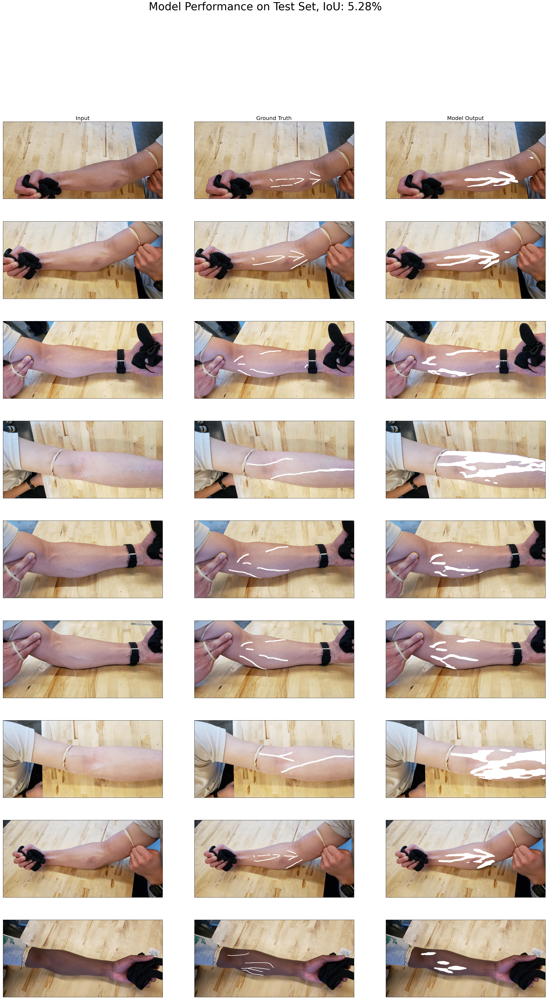

In [ ]:
# Visualize
IoU, avg_loss, images, masks, gt = test(model, test_loader, optimizer)

set_size = images.shape[0]
mask = (torch.unsqueeze(masks, 1) == 1).repeat(1, 3, 1, 1)
output_images = torch.clone(images)
output_images[mask] = 1
transform = torchvision.transforms.ToPILImage()
for i, image in enumerate(output_images):
    pil_image = transform(image)
    pil_image.save(f"output{i:2d}.jpg")

# TODO: Write matplotlib code to display all images
outputs = output_images
gt_mask = torch.unsqueeze(gt == 1, dim = 1).repeat(1, 3, 1, 1)
gt_images = torch.clone(images)
gt_images[gt_mask] = 1

visual = torch.stack((images, gt_images, output_images), dim = 1)


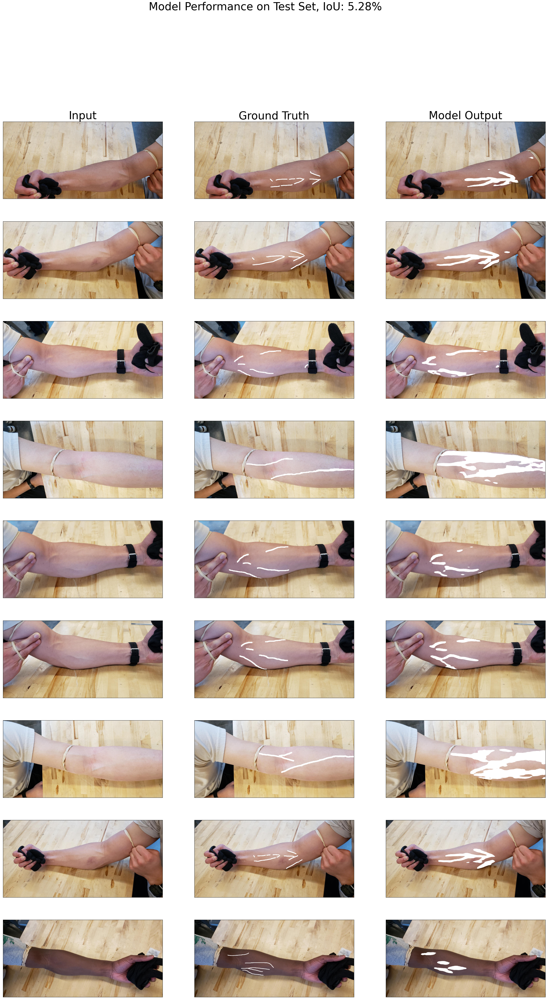

In [ ]:
plt.rcParams['figure.figsize'] = [36, 60]
plot(visual, False, None, ["Input", "Ground Truth", "Model Output"], title = f"Model Performance on Test Set, IoU: {IoU * 100:.02f}%")